<a href="https://colab.research.google.com/github/osfarias/projetos/blob/main/draft_metodologia_2_tl_variado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# Programa de Pós-Graduação em Ciência da Computação — UFMA

**Curso:** Ciência da Computação — UFMA  
**Disciplina:** Sistemas de Visão Computacional  
**Professor:** Prof. Dr. Geraldo Braz Júnior  
**Projeto:** Reconhecimento de Pessoas em Imagens — Fase 1  

**Equipe 02:** Arnaud, Guilherme, Osvaldo, Wesley e Yure  

---

## Critérios iniciais da Fase 1

A Fase 1 do projeto tem como objetivo implementar uma CNN para o reconhecimento de pessoas em imagens, considerando a tarefa de classificação binária:

> Dada uma imagem, determinar se há ou não uma pessoa presente.

O desenvolvimento deve explorar conceitos fundamentais de redes neurais convolucionais, incluindo:

- blocos convolucionais;
- otimizadores;
- funções de custo;
- estratégias de Transfer Learning;
- técnicas de regularização.

---

## Resumo dos experimentos realizados

Nesta fase, foram conduzidos experimentos com uma **CNN customizada**, treinada do zero, e com arquiteturas clássicas baseadas em **Transfer Learning**, permitindo comparar o desempenho entre uma abordagem própria e modelos pré-treinados.

A CNN customizada foi utilizada como baseline do grupo. Durante os experimentos, foram aplicadas técnicas de regularização e melhoria de generalização, incluindo:

- data augmentation no conjunto de treino;
- dropout na CNN própria;
- congelamento de camadas nos modelos pré-treinados;
- uso de learning rate reduzido no fine-tuning completo leve;
- uso de learning rates diferenciados no fine-tuning parcial da ResNet50.

Além disso, foram avaliadas arquiteturas pré-treinadas, com o objetivo de comparar seus resultados com a CNN construída do zero.

As principais configurações do experimento, como tamanho das imagens, batch size, número de épocas, taxa de aprendizado e número de classes, foram centralizadas em um dicionário de configuração. Essa organização facilita a repetição dos experimentos, o controle dos hiperparâmetros e a análise comparativa dos resultados.

In [ ]:
!pip install -q tqdm

In [ ]:
from pathlib import Path
import os
import zipfile
import urllib.request
from tqdm.auto import tqdm

COCO_ROOT = Path("/content/coco2017")
COCO_ROOT.mkdir(parents=True, exist_ok=True)

URLS = {
    "train2017": "http://images.cocodataset.org/zips/train2017.zip",
    "val2017": "http://images.cocodataset.org/zips/val2017.zip",
    "annotations": "http://images.cocodataset.org/annotations/annotations_trainval2017.zip",
}

# mais rapido
#URLS = {
#    "val2017": "http://images.cocodataset.org/zips/val2017.zip",
#    "annotations": "http://images.cocodataset.org/annotations/annotations_trainval2017.zip",
#}

def download_file_with_progress(url: str, output_path: Path) -> None:
    """
    Baixa um arquivo mostrando progresso, velocidade e tamanho baixado.

    A função evita baixar novamente caso o arquivo já exista no runtime atual.
    """
    if output_path.exists():
        size_gb = output_path.stat().st_size / (1024 ** 3)
        print(f"Arquivo já existe: {output_path.name} ({size_gb:.2f} GB)")
        return

    with urllib.request.urlopen(url) as response:
        total_size = int(response.headers.get("Content-Length", 0))
        block_size = 1024 * 1024

        total_gb = total_size / (1024 ** 3)
        print(f"Baixando: {output_path.name}")
        print(f"Tamanho esperado: {total_gb:.2f} GB")

        with open(output_path, "wb") as file:
            with tqdm(
                total=total_size,
                unit="B",
                unit_scale=True,
                unit_divisor=1024,
                desc=output_path.name,
            ) as progress_bar:
                while True:
                    chunk = response.read(block_size)

                    if not chunk:
                        break

                    file.write(chunk)
                    progress_bar.update(len(chunk))

    downloaded_gb = output_path.stat().st_size / (1024 ** 3)
    print(f"Download finalizado: {output_path.name} ({downloaded_gb:.2f} GB)")


def unzip_file_with_progress(zip_path: Path, extract_to: Path) -> None:
    """
    Extrai um arquivo ZIP mostrando progresso por arquivo extraído.
    """
    expected_folder = extract_to / zip_path.stem

    if expected_folder.exists():
        print(f"Pasta já extraída: {expected_folder}")
        return

    print(f"Extraindo: {zip_path.name}")

    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        members = zip_ref.infolist()

        for member in tqdm(members, desc=f"Extraindo {zip_path.name}"):
            zip_ref.extract(member, extract_to)

    print(f"Extração finalizada: {zip_path.name}")


for name, url in URLS.items():
    zip_path = COCO_ROOT / f"{name}.zip"
    download_file_with_progress(url, zip_path)
    unzip_file_with_progress(zip_path, COCO_ROOT)

print("COCO 2017 configurado em:", COCO_ROOT)

Baixando: train2017.zip
Tamanho esperado: 18.01 GB


train2017.zip:   0%|          | 0.00/18.0G [00:00<?, ?B/s]

Download finalizado: train2017.zip (18.01 GB)
Extraindo: train2017.zip


Extraindo train2017.zip:   0%|          | 0/118288 [00:00<?, ?it/s]

Extração finalizada: train2017.zip
Baixando: val2017.zip
Tamanho esperado: 0.76 GB


val2017.zip:   0%|          | 0.00/778M [00:00<?, ?B/s]

Download finalizado: val2017.zip (0.76 GB)
Extraindo: val2017.zip


Extraindo val2017.zip:   0%|          | 0/5001 [00:00<?, ?it/s]

Extração finalizada: val2017.zip
Baixando: annotations.zip
Tamanho esperado: 0.24 GB


annotations.zip:   0%|          | 0.00/241M [00:00<?, ?B/s]

Download finalizado: annotations.zip (0.24 GB)
Extraindo: annotations.zip


Extraindo annotations.zip:   0%|          | 0/6 [00:00<?, ?it/s]

Extração finalizada: annotations.zip
COCO 2017 configurado em: /content/coco2017


In [ ]:
CONFIG = {
    "img_size": 224,
    "batch_size": 32,
    "epochs": 5,
    "lr": 1e-4,
    "num_workers": 2,
    "pin_memory": True,
    "dataset_path": "/content/coco2017",
    "num_classes": 2,
    "train_size": 5000,
    "test_size": 1000,
    "model_name": "fase1_pessoa_vs_nao_pessoa",
}

print("Dataset path:", CONFIG["dataset_path"])
print("Train images:", os.path.exists(f'{CONFIG["dataset_path"]}/train2017'))
print("Val images:", os.path.exists(f'{CONFIG["dataset_path"]}/val2017'))
print("Train annotations:", os.path.exists(f'{CONFIG["dataset_path"]}/annotations/instances_train2017.json'))
print("Val annotations:", os.path.exists(f'{CONFIG["dataset_path"]}/annotations/instances_val2017.json'))

Dataset path: /content/coco2017
Train images: True
Val images: True
Train annotations: True
Val annotations: True


In [ ]:
# imports
import os, json, torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
# relatorio, matriz de confusao e visualização
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device:', device)


Device: cuda


In [ ]:
# Dataset (Base para CNN e DenseNet)
# Usada para cnn construida, densenet, treino e teste (nao muda entre os modelos)
class CocoBinaryDataset(Dataset):
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        with open(annotation_file) as f:
            data = json.load(f)
        self.images = data['images']
        self.annotations = data['annotations']
        self.labels = {img['id']: 0 for img in self.images}
        for ann in self.annotations:
            if ann['category_id'] == 1:
                self.labels[ann['image_id']] = 1

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_info = self.images[idx]
        path = os.path.join(self.image_dir, img_info['file_name'])
        # contorno para crashes no kaggle relativos a imagem
        try:
            image = Image.open(path).convert('RGB')
        except:
            return self.__getitem__((idx + 1) % len(self.images))

        label = int(self.labels[img_info['id']])
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
"""
Pré-processamento e data augmentation.

transform_train: usado exclusivamente no treino. Aplica três técnicas
de augmentation que aumentam artificialmente a diversidade do dataset
sem coletar novas imagens:
  - RandomHorizontalFlip: espelha 50% das imagens horizontalmente.
    Pessoas continuam sendo pessoas independente do lado.
  - RandomRotation(15): gira a imagem em até 15° para qualquer lado,
    simulando variação de ângulo de captura.
  - ColorJitter: varia brilho e contraste em até 20%, simulando
    diferentes condições de iluminação.

transform_test: usado em teste. Sem augmentation — avaliação deve
ser determinística e reproduzível.

A normalização usa as estatísticas do ImageNet (mean/std padrão),
obrigatória para os modelos de transfer learning pré-treinados.
"""
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

transform_train = transforms.Compose([
    transforms.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

print(transform_train)


Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=None, hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


In [ ]:
import random
from torch.utils.data import Subset, DataLoader


def create_dataloaders(seed: int):
    """
    Cria os DataLoaders de treino e teste para uma execução hold-out.

    Cada seed gera uma amostragem diferente dos subconjuntos de treino e
    teste, permitindo executar o experimento cinco vezes conforme solicitado.

    O treino usa COCO train2017 e o teste usa COCO val2017, pois o COCO
    test2017 não possui anotações públicas.
    """
    random.seed(seed)

    train_full_dataset = CocoBinaryDataset(
        image_dir=f"{CONFIG['dataset_path']}/train2017",
        annotation_file=f"{CONFIG['dataset_path']}/annotations/instances_train2017.json",
        transform=transform_train
    )

    test_full_dataset = CocoBinaryDataset(
        image_dir=f"{CONFIG['dataset_path']}/val2017",
        annotation_file=f"{CONFIG['dataset_path']}/annotations/instances_val2017.json",
        transform=transform
    )

    train_indices = random.sample(
        range(len(train_full_dataset)),
        CONFIG["train_size"]
    )

    test_indices = random.sample(
        range(len(test_full_dataset)),
        CONFIG["test_size"]
    )

    train_dataset = Subset(train_full_dataset, train_indices)
    test_dataset = Subset(test_full_dataset, test_indices)

    train_loader = DataLoader(
        train_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=True,
        num_workers=CONFIG["num_workers"],
        pin_memory=CONFIG["pin_memory"]
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=False,
        num_workers=CONFIG["num_workers"],
        pin_memory=CONFIG["pin_memory"]
    )

    return train_loader, test_loader, train_dataset, test_dataset

In [ ]:
train_loader, test_loader, train_dataset, test_dataset = create_dataloaders(seed=42)

print("Treino:", len(train_dataset))
print("Teste:", len(test_dataset))

Treino: 5000
Teste: 1000


In [ ]:
"""
Sanity check do DataLoader.

Esta célula verifica se o DataLoader está retornando imagens e rótulos no
formato esperado antes de iniciar o treinamento dos modelos.

Esperado:
    - images: [batch_size, canais, altura, largura]
    - labels: [batch_size]
    - classes presentes: 0 e/ou 1
"""

images, labels = next(iter(train_loader))

print("Batch images:", images.shape)
print("Batch labels:", labels.shape)
print("Labels únicas:", labels.unique())

Batch images: torch.Size([32, 3, 224, 224])
Batch labels: torch.Size([32])
Labels únicas: tensor([0, 1])


In [ ]:
"""
CNN da Equipe 2 — arquitetura própria treinada do zero.

Estrutura:
  - 3 blocos convolucionais (Conv → ReLU → MaxPool)
    com filtros crescentes (32 → 64 → 128).
  - AdaptiveAvgPool(4x4) para garantir saída de tamanho fixo
    independente da resolução de entrada.
  - 2 camadas densas (2048 → 128 → 2 classes).

Regularização:
  - Dropout(p=0.5) entre as camadas densas. Durante o treino,
    desliga aleatoriamente 50% dos neurônios da camada fc1, forçando
    a rede a aprender representações mais robustas e reduzindo
    overfitting. No modo eval(), o Dropout é automaticamente
    desligado pelo PyTorch.

Servida como baseline para comparar contra modelos pré-treinados
(transfer learning) — demonstra a vantagem de TL com dados limitados.
"""
import torch.nn.functional as F

class cnn_equipe2(nn.Module):
    def __init__(self):
        super(cnn_equipe2, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3,   out_channels=32,  kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32,  out_channels=64,  kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64,  out_channels=128, kernel_size=3, padding=1)

        self.pool = nn.MaxPool2d(2, 2)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 4))

        self.dropout = nn.Dropout(p=0.5)

        self.fc1 = nn.Linear(128 * 4 * 4, 128)
        self.fc2 = nn.Linear(128, CONFIG['num_classes'])

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = self.adaptive_pool(x)
        x = torch.flatten(x, 1)

        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

model_cnn = cnn_equipe2().to(device)

In [ ]:
model = cnn_equipe2().to(device)

outputs = model(images.to(device))

print("Saída:", outputs.shape)

Saída: torch.Size([32, 2])


In [ ]:
# Transfer Learning com ResNet50 usando fine-tuning parcial
# Estratégia: congelar a maior parte da rede e treinar apenas o último bloco convolucional + classificador final

model_resnet_finetune = models.resnet50(pretrained=True)

for param in model_resnet_finetune.parameters():
    param.requires_grad = False

for param in model_resnet_finetune.layer4.parameters():
    param.requires_grad = True

model_resnet_finetune.fc = nn.Linear(
    model_resnet_finetune.fc.in_features,
    CONFIG["num_classes"]
)

for param in model_resnet_finetune.fc.parameters():
    param.requires_grad = True

model_resnet_finetune = model_resnet_finetune.to(device)

optimizer_resnet_finetune = optim.Adam(
    filter(lambda param: param.requires_grad, model_resnet_finetune.parameters()),
    lr=CONFIG["lr"]
)

print("ResNet50 fine-tuning parcial configurada.")

ResNet50 fine-tuning parcial configurada.


In [ ]:
"""
Transfer Learning com MobileNetV2 usando fine-tuning completo leve.

Estratégia:
  - Carrega a MobileNetV2 pré-treinada.
  - Substitui o classificador final para 2 classes.
  - Mantém toda a rede treinável.
  - Usa learning rate menor para evitar destruir os pesos pré-treinados.

Essa estratégia difere do feature extraction porque não congela a backbone.
Também difere do fine-tuning parcial da ResNet50 porque permite ajuste em
todas as camadas, mas de forma mais conservadora usando lr menor.
"""

model_mobilenet = models.mobilenet_v2(pretrained=True)

model_mobilenet.classifier[1] = nn.Linear(
    model_mobilenet.classifier[1].in_features,
    CONFIG["num_classes"]
)

for param in model_mobilenet.parameters():
    param.requires_grad = True

model_mobilenet = model_mobilenet.to(device)

optimizer_mobilenet = optim.Adam(
    model_mobilenet.parameters(),
    lr=CONFIG["lr"] / 10
)

print("MobileNetV2 fine-tuning completo leve configurada.")

MobileNetV2 fine-tuning completo leve configurada.


In [ ]:
outputs = model_mobilenet(images.to(device))

print("Saída MobileNetV2:", outputs.shape)

Saída MobileNetV2: torch.Size([32, 2])


In [ ]:
"""
Transfer Learning com DenseNet121 usando feature extraction.

Estratégia:
  - Carrega a DenseNet121 pré-treinada.
  - Congela a backbone convolucional.
  - Substitui o classificador final para produzir 2 classes:
    não pessoa e pessoa.
  - Treina apenas o classificador final.

Essa arquitetura funciona como uma das três arquiteturas clássicas exigidas
no experimento, junto com ResNet50 e MobileNetV2.
"""

model_dense = models.densenet121(pretrained=True)

for param in model_dense.features.parameters():
    param.requires_grad = False

model_dense.classifier = nn.Linear(
    model_dense.classifier.in_features,
    CONFIG["num_classes"]
)

model_dense = model_dense.to(device)

optimizer_dense = optim.Adam(
    model_dense.classifier.parameters(),
    lr=CONFIG["lr"]
)

print("DenseNet121 feature extraction configurada.")

DenseNet121 feature extraction configurada.


In [ ]:
outputs = model_dense(images.to(device))

print("Saída DenseNet121:", outputs.shape)

Saída DenseNet121: torch.Size([32, 2])


In [ ]:
# Setup de treino
# Meta: suportar model_cnn (cnn da equipe 2) e model_dense

# Loss mesma para os dois modelos
criterion = nn.CrossEntropyLoss()

# Otimização

# CNN da equipe 2
# Melhoria: aumentado o learning rate da CNNEquipe2
# optimizer_cnn = optim.Adam(model_cnn.parameters(), lr=CONFIG['lr'])
# Testado com 15 e 25 epocas
optimizer_cnn = optim.Adam(model_cnn.parameters(), lr=1e-3)
# TODO: Testar respectivamente de 25 a 30 epocas
# optimizer_cnn = optim.Adam(model_cnn.parameters(), lr=5e-4)
# optimizer_cnn = optim.Adam(model_cnn.parameters(), lr=2e-3)
# .
# DenseNet (só treina o classificador)
optimizer_dense = optim.Adam(model_dense.classifier.parameters(), lr=CONFIG['lr'])

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


def train_model(model, optimizer, criterion, train_loader, model_name):
    """
    Treina um modelo por CONFIG["epochs"] épocas.

    Retorna a curva de loss média por época para que possamos plotar depois.
    """
    model.train()
    loss_curve = []

    print(f"Iniciando treino: {model_name}")

    for epoch in range(CONFIG["epochs"]):
        running_loss = 0.0
        total_batches = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            total_batches += 1

        epoch_loss = running_loss / total_batches
        loss_curve.append(epoch_loss)

        print(
            f"{model_name} | Epoch {epoch + 1}/{CONFIG['epochs']} "
            f"| Loss: {epoch_loss:.4f}"
        )

    return loss_curve


def evaluate_model(model, test_loader, model_name):
    """
    Avalia um modelo no conjunto de teste.

    Retorna acurácia, relatório por classe, matriz de confusão,
    rótulos reais e predições.
    """
    model.eval()

    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)

    report = classification_report(
        all_labels,
        all_preds,
        output_dict=True,
        zero_division=0
    )

    cm = confusion_matrix(all_labels, all_preds)

    print(f"\nResultado: {model_name}")
    print(f"Acurácia: {accuracy * 100:.2f}%")
    print(classification_report(all_labels, all_preds, zero_division=0))

    return accuracy, report, cm, all_labels, all_preds

## Variação da estratégia de Transfer Learning

O notebook diferencia três estratégias de Transfer Learning:

1. **Feature extraction**  
   A backbone pré-treinada fica congelada e apenas o classificador final é treinado.

2. **Fine-tuning parcial**  
   A maior parte da backbone fica congelada, mas o último bloco convolucional é descongelado e treinado junto com o classificador final.

3. **Fine-tuning completo leve**  
   Toda a rede pré-treinada permanece treinável, mas com learning rate reduzido para evitar alterações bruscas nos pesos aprendidos previamente.

Nesta versão, as estratégias foram aplicadas da seguinte forma:

| Modelo | Estratégia | Parte treinada |
|---|---|---|
| DenseNet121_FeatureExtraction | Feature extraction | Classificador final |
| ResNet50_FineTune_Layer4 | Fine-tuning parcial | `layer4` + `fc` |
| MobileNetV2_FineTune_Full_Light | Fine-tuning completo leve | Rede inteira com learning rate reduzido |

Essa configuração torna o experimento defensável em relação ao requisito de testar diferentes formas de Transfer Learning, pois não apenas compara arquiteturas clássicas, mas também compara diferentes níveis de adaptação dos pesos pré-treinados ao problema de classificação binária pessoa vs não pessoa.

In [ ]:
def count_trainable_parameters(model):
    """
    Conta apenas parâmetros com requires_grad=True.

    Essa função ajuda a documentar a diferença entre as estratégias de
    treinamento. Feature extraction treina poucos parâmetros, fine-tuning
    parcial treina parte da backbone, e fine-tuning completo leve treina toda
    a rede com learning rate menor.
    """
    return sum(param.numel() for param in model.parameters() if param.requires_grad)


def build_densenet121_feature_extraction():
    """
    Cria uma DenseNet121 usando Transfer Learning por feature extraction.

    Estratégia:
        - Features convolucionais congeladas.
        - Apenas o classificador final é substituído e treinado.
    """
    model = models.densenet121(pretrained=True)

    for param in model.features.parameters():
        param.requires_grad = False

    model.classifier = nn.Linear(
        model.classifier.in_features,
        CONFIG["num_classes"]
    )

    return model.to(device)


def build_resnet50_finetune_layer4():
    """
    Cria uma ResNet50 usando fine-tuning parcial.

    Estratégia:
        - Congela a maior parte da backbone.
        - Descongela o bloco final layer4.
        - Substitui e treina a camada final fc.

    Intuição:
        as primeiras camadas aprendem bordas, texturas e padrões genéricos;
        o último bloco aprende representações mais específicas da tarefa.
        Por isso, descongelar layer4 adapta o modelo ao problema pessoa vs
        não pessoa sem o custo de treinar toda a rede.
    """
    model = models.resnet50(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False

    for param in model.layer4.parameters():
        param.requires_grad = True

    model.fc = nn.Linear(
        model.fc.in_features,
        CONFIG["num_classes"]
    )

    for param in model.fc.parameters():
        param.requires_grad = True

    return model.to(device)


def build_mobilenetv2_finetune_full_light():
    """
    Cria uma MobileNetV2 usando fine-tuning completo leve.

    Estratégia:
        - Carrega a MobileNetV2 pré-treinada.
        - Substitui o classificador final.
        - Mantém toda a rede treinável.
        - Usa learning rate menor para preservar os pesos pré-treinados.

    Essa estratégia difere do feature extraction porque a backbone não é
    congelada. Também difere do fine-tuning parcial porque todas as camadas
    podem ser ajustadas.
    """
    model = models.mobilenet_v2(pretrained=True)

    model.classifier[1] = nn.Linear(
        model.classifier[1].in_features,
        CONFIG["num_classes"]
    )

    for param in model.parameters():
        param.requires_grad = True

    return model.to(device)


def build_optimizer(model, name):
    """
    Cria otimizador Adam adequado para cada estratégia.

    Para fine-tuning parcial, usamos learning rate menor no bloco layer4 e
    learning rate padrão no classificador final.

    Para fine-tuning completo leve, usamos learning rate reduzido em toda a
    MobileNetV2 para evitar destruir rapidamente os pesos pré-treinados.
    """
    if name == "ResNet50_FineTune_Layer4":
        return optim.Adam(
            [
                {"params": model.layer4.parameters(), "lr": 1e-5},
                {"params": model.fc.parameters(), "lr": CONFIG["lr"]},
            ]
        )

    if name == "MobileNetV2_FineTune_Full_Light":
        return optim.Adam(
            model.parameters(),
            lr=CONFIG["lr"] / 10
        )

    return optim.Adam(
        [param for param in model.parameters() if param.requires_grad],
        lr=CONFIG["lr"]
    )


EXPERIMENTS = [
    {
        "name": "CNNEquipe2",
        "architecture": "CNN própria",
        "strategy": "treinada do zero",
        "builder": lambda: cnn_equipe2().to(device),
        "optimizer_builder": lambda model: optim.Adam(model.parameters(), lr=1e-3),
    },
    {
        "name": "DenseNet121_FeatureExtraction",
        "architecture": "DenseNet121",
        "strategy": "feature extraction",
        "builder": build_densenet121_feature_extraction,
        "optimizer_builder": lambda model: build_optimizer(model, "DenseNet121_FeatureExtraction"),
    },
    {
        "name": "ResNet50_FineTune_Layer4",
        "architecture": "ResNet50",
        "strategy": "fine-tuning parcial",
        "builder": build_resnet50_finetune_layer4,
        "optimizer_builder": lambda model: build_optimizer(model, "ResNet50_FineTune_Layer4"),
    },
    {
        "name": "MobileNetV2_FineTune_Full_Light",
        "architecture": "MobileNetV2",
        "strategy": "fine-tuning completo leve",
        "builder": build_mobilenetv2_finetune_full_light,
        "optimizer_builder": lambda model: build_optimizer(model, "MobileNetV2_FineTune_Full_Light"),
    },
]

MODEL_NAMES = [experiment["name"] for experiment in EXPERIMENTS]

MODEL_METADATA = {
    experiment["name"]: {
        "architecture": experiment["architecture"],
        "strategy": experiment["strategy"],
    }
    for experiment in EXPERIMENTS
}


def get_fresh_models():
    """
    Instancia todos os modelos novamente para cada execução do hold-out.

    Isso garante que cada execução começa limpa, com pesos iniciais
    equivalentes e sem carregar aprendizado residual da execução anterior.
    """
    models_list = []

    for experiment in EXPERIMENTS:
        model = experiment["builder"]()
        optimizer = experiment["optimizer_builder"](model)
        trainable_params = count_trainable_parameters(model)

        print(
            f"{experiment['name']} | estratégia: {experiment['strategy']} | "
            f"parâmetros treináveis: {trainable_params:,}"
        )

        models_list.append((model, optimizer, experiment["name"]))

    return models_list

In [ ]:
"""
Configuração final do experimento.

Durante os testes rápidos usamos CONFIG["epochs"] = 1.
Para o experimento final, ajustamos para 5 épocas, mantendo o protocolo
de hold-out com 5 execuções.

Total esperado:
    4 modelos × 5 execuções × 5 épocas
"""

CONFIG["epochs"] = 5

NUM_RUNS = 5
SEEDS = [42, 43, 44, 45, 46]

print("Configuração final:")
print(f"Épocas por treinamento: {CONFIG['epochs']}")
print(f"Número de execuções hold-out: {NUM_RUNS}")
print(f"Seeds: {SEEDS}")
print(f"Total de treinamentos: {len(MODEL_NAMES)} modelos × {NUM_RUNS} execuções = {len(MODEL_NAMES) * NUM_RUNS}")
print(f"Total de épocas executadas: {len(MODEL_NAMES) * NUM_RUNS * CONFIG['epochs']}")

Configuração final:
Épocas por treinamento: 5
Número de execuções hold-out: 5
Seeds: [42, 43, 44, 45, 46]
Total de treinamentos: 4 modelos × 5 execuções = 20
Total de épocas executadas: 100


In [ ]:
"""
Hold-out com 5 execuções.

Atende ao requisito do enunciado usando hold-out com 5 execuções. Em cada
execução, a seed muda e os DataLoaders são recriados com uma nova amostragem.

Experimentos executados:
    - CNNEquipe2: CNN própria treinada do zero.
    - DenseNet121: Transfer Learning com feature extraction.
    - ResNet50: Transfer Learning com fine-tuning parcial.
    - MobileNetV2: Transfer Learning com fine-tuning completo leve.

Para cada execução, armazena:
    - curva de loss de treino;
    - accuracy global;
    - precision, recall e F1-score por classe;
    - matriz de confusão.
"""

import gc
import random
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

NUM_RUNS = 5
SEEDS = [42, 43, 44, 45, 46]

criterion = nn.CrossEntropyLoss()

METRIC_KEYS = [
    "accuracy",
    "precision_macro",
    "recall_macro",
    "f1_macro",
    "precision_nao_pessoa",
    "recall_nao_pessoa",
    "f1_nao_pessoa",
    "precision_pessoa",
    "recall_pessoa",
    "f1_pessoa",
]

results = {
    name: {
        **{metric: [] for metric in METRIC_KEYS},
        "train_histories": [],
        "labels_per_run": [],
        "preds_per_run": [],
        "confusion_matrices": [],
    }
    for name in MODEL_NAMES
}

rows = []

for run_idx, seed in enumerate(SEEDS, start=1):
    print(f"\n{'=' * 80}")
    print(f"EXECUÇÃO {run_idx}/{NUM_RUNS} — seed={seed}")
    print(f"{'=' * 80}")

    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)

    train_loader, test_loader, train_dataset, test_dataset = create_dataloaders(seed)

    models_list = get_fresh_models()

    for model, optimizer, name in models_list:
        print(f"\n{'-' * 80}")
        print(f"Treinando: {name}")
        print(f"{'-' * 80}")

        loss_curve = train_model(
            model=model,
            optimizer=optimizer,
            criterion=criterion,
            train_loader=train_loader,
            model_name=name
        )

        accuracy, report, cm, all_labels, all_preds = evaluate_model(
            model=model,
            test_loader=test_loader,
            model_name=name
        )

        metrics = {
            "accuracy": round(accuracy, 4),
            "precision_macro": round(report["macro avg"]["precision"], 4),
            "recall_macro": round(report["macro avg"]["recall"], 4),
            "f1_macro": round(report["macro avg"]["f1-score"], 4),
            "precision_nao_pessoa": round(report["0"]["precision"], 4),
            "recall_nao_pessoa": round(report["0"]["recall"], 4),
            "f1_nao_pessoa": round(report["0"]["f1-score"], 4),
            "precision_pessoa": round(report["1"]["precision"], 4),
            "recall_pessoa": round(report["1"]["recall"], 4),
            "f1_pessoa": round(report["1"]["f1-score"], 4),
        }

        for metric in METRIC_KEYS:
            results[name][metric].append(metrics[metric])

        results[name]["train_histories"].append(loss_curve)
        results[name]["labels_per_run"].append(all_labels)
        results[name]["preds_per_run"].append(all_preds)
        results[name]["confusion_matrices"].append(cm)

        row = {
            "modelo": name,
            "arquitetura": MODEL_METADATA[name]["architecture"],
            "estrategia": MODEL_METADATA[name]["strategy"],
            "execucao": run_idx,
            "seed": seed,
            **metrics,
        }

        rows.append(row)

        del model
        torch.cuda.empty_cache()
        gc.collect()

results_df = pd.DataFrame(rows)

summary_df = (
    results_df
    .groupby(["modelo", "arquitetura", "estrategia"])
    .agg(
        accuracy_mean=("accuracy", "mean"),
        accuracy_std=("accuracy", "std"),
        f1_macro_mean=("f1_macro", "mean"),
        f1_macro_std=("f1_macro", "std"),
        f1_pessoa_mean=("f1_pessoa", "mean"),
        f1_pessoa_std=("f1_pessoa", "std"),
        f1_nao_pessoa_mean=("f1_nao_pessoa", "mean"),
        f1_nao_pessoa_std=("f1_nao_pessoa", "std"),
    )
    .reset_index()
    .sort_values("f1_macro_mean", ascending=False)
)

results_df.to_csv("/content/resultados_por_execucao.csv", index=False)
summary_df.to_csv("/content/resumo_resultados.csv", index=False)

torch.save(
    {
        "results": results,
        "results_df": results_df,
        "summary_df": summary_df,
    },
    "/content/artefatos_fase1.pt"
)

print(f"\n{'=' * 80}")
print(f"✅ {NUM_RUNS} execuções concluídas para {len(MODEL_NAMES)} experimentos.")
print("Resultados salvos em /content/resultados_por_execucao.csv")
print("Resumo salvo em /content/resumo_resultados.csv")
print("Artefatos salvos em /content/artefatos_fase1.pt")
print(f"{'=' * 80}")

summary_df


EXECUÇÃO 1/5 — seed=42
CNNEquipe2 | estratégia: treinada do zero | parâmetros treináveis: 355,778


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet121_FeatureExtraction | estratégia: feature extraction | parâmetros treináveis: 2,050


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50_FineTune_Layer4 | estratégia: fine-tuning parcial | parâmetros treináveis: 14,968,834
MobileNetV2_FineTune_Full_Light | estratégia: fine-tuning completo leve | parâmetros treináveis: 2,226,434

--------------------------------------------------------------------------------
Treinando: CNNEquipe2
--------------------------------------------------------------------------------
Iniciando treino: CNNEquipe2


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNEquipe2 | Epoch 1/5 | Loss: 0.6815
CNNEquipe2 | Epoch 2/5 | Loss: 0.6724
CNNEquipe2 | Epoch 3/5 | Loss: 0.6625
CNNEquipe2 | Epoch 4/5 | Loss: 0.6473
CNNEquipe2 | Epoch 5/5 | Loss: 0.6442

Resultado: CNNEquipe2
Acurácia: 64.30%
              precision    recall  f1-score   support

           0       0.68      0.44      0.53       464
           1       0.63      0.82      0.71       536

    accuracy                           0.64      1000
   macro avg       0.65      0.63      0.62      1000
weighted avg       0.65      0.64      0.63      1000


--------------------------------------------------------------------------------
Treinando: DenseNet121_FeatureExtraction
--------------------------------------------------------------------------------
Iniciando treino: DenseNet121_FeatureExtraction
DenseNet121_FeatureExtraction | Epoch 1/5 | Loss: 0.6153
DenseNet121_FeatureExtraction | Epoch 2/5 | Loss: 0.5012
DenseNet121_FeatureExtraction | Epoch 3/5 | Loss: 0.4522
DenseNet121_FeatureE

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet121_FeatureExtraction | estratégia: feature extraction | parâmetros treináveis: 2,050


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50_FineTune_Layer4 | estratégia: fine-tuning parcial | parâmetros treináveis: 14,968,834
MobileNetV2_FineTune_Full_Light | estratégia: fine-tuning completo leve | parâmetros treináveis: 2,226,434

--------------------------------------------------------------------------------
Treinando: CNNEquipe2
--------------------------------------------------------------------------------
Iniciando treino: CNNEquipe2


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNEquipe2 | Epoch 1/5 | Loss: 0.6864
CNNEquipe2 | Epoch 2/5 | Loss: 0.6723
CNNEquipe2 | Epoch 3/5 | Loss: 0.6640
CNNEquipe2 | Epoch 4/5 | Loss: 0.6529
CNNEquipe2 | Epoch 5/5 | Loss: 0.6452

Resultado: CNNEquipe2
Acurácia: 60.70%
              precision    recall  f1-score   support

           0       0.66      0.30      0.41       459
           1       0.59      0.87      0.71       541

    accuracy                           0.61      1000
   macro avg       0.63      0.58      0.56      1000
weighted avg       0.62      0.61      0.57      1000


--------------------------------------------------------------------------------
Treinando: DenseNet121_FeatureExtraction
--------------------------------------------------------------------------------
Iniciando treino: DenseNet121_FeatureExtraction
DenseNet121_FeatureExtraction | Epoch 1/5 | Loss: 0.5901
DenseNet121_FeatureExtraction | Epoch 2/5 | Loss: 0.4925
DenseNet121_FeatureExtraction | Epoch 3/5 | Loss: 0.4410
DenseNet121_FeatureE

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet121_FeatureExtraction | estratégia: feature extraction | parâmetros treináveis: 2,050


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50_FineTune_Layer4 | estratégia: fine-tuning parcial | parâmetros treináveis: 14,968,834
MobileNetV2_FineTune_Full_Light | estratégia: fine-tuning completo leve | parâmetros treináveis: 2,226,434

--------------------------------------------------------------------------------
Treinando: CNNEquipe2
--------------------------------------------------------------------------------
Iniciando treino: CNNEquipe2


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNEquipe2 | Epoch 1/5 | Loss: 0.6858
CNNEquipe2 | Epoch 2/5 | Loss: 0.6699
CNNEquipe2 | Epoch 3/5 | Loss: 0.6563
CNNEquipe2 | Epoch 4/5 | Loss: 0.6495
CNNEquipe2 | Epoch 5/5 | Loss: 0.6381

Resultado: CNNEquipe2
Acurácia: 64.50%
              precision    recall  f1-score   support

           0       0.71      0.40      0.52       468
           1       0.62      0.86      0.72       532

    accuracy                           0.65      1000
   macro avg       0.67      0.63      0.62      1000
weighted avg       0.66      0.65      0.62      1000


--------------------------------------------------------------------------------
Treinando: DenseNet121_FeatureExtraction
--------------------------------------------------------------------------------
Iniciando treino: DenseNet121_FeatureExtraction
DenseNet121_FeatureExtraction | Epoch 1/5 | Loss: 0.6456
DenseNet121_FeatureExtraction | Epoch 2/5 | Loss: 0.5064
DenseNet121_FeatureExtraction | Epoch 3/5 | Loss: 0.4508
DenseNet121_FeatureE

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet121_FeatureExtraction | estratégia: feature extraction | parâmetros treináveis: 2,050


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50_FineTune_Layer4 | estratégia: fine-tuning parcial | parâmetros treináveis: 14,968,834
MobileNetV2_FineTune_Full_Light | estratégia: fine-tuning completo leve | parâmetros treináveis: 2,226,434

--------------------------------------------------------------------------------
Treinando: CNNEquipe2
--------------------------------------------------------------------------------
Iniciando treino: CNNEquipe2


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNEquipe2 | Epoch 1/5 | Loss: 0.6811
CNNEquipe2 | Epoch 2/5 | Loss: 0.6693
CNNEquipe2 | Epoch 3/5 | Loss: 0.6650
CNNEquipe2 | Epoch 4/5 | Loss: 0.6525
CNNEquipe2 | Epoch 5/5 | Loss: 0.6474

Resultado: CNNEquipe2
Acurácia: 64.40%
              precision    recall  f1-score   support

           0       0.67      0.40      0.50       445
           1       0.64      0.84      0.72       555

    accuracy                           0.64      1000
   macro avg       0.65      0.62      0.61      1000
weighted avg       0.65      0.64      0.62      1000


--------------------------------------------------------------------------------
Treinando: DenseNet121_FeatureExtraction
--------------------------------------------------------------------------------
Iniciando treino: DenseNet121_FeatureExtraction
DenseNet121_FeatureExtraction | Epoch 1/5 | Loss: 0.6285
DenseNet121_FeatureExtraction | Epoch 2/5 | Loss: 0.5116
DenseNet121_FeatureExtraction | Epoch 3/5 | Loss: 0.4526
DenseNet121_FeatureE

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet121_FeatureExtraction | estratégia: feature extraction | parâmetros treináveis: 2,050


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50_FineTune_Layer4 | estratégia: fine-tuning parcial | parâmetros treináveis: 14,968,834
MobileNetV2_FineTune_Full_Light | estratégia: fine-tuning completo leve | parâmetros treináveis: 2,226,434

--------------------------------------------------------------------------------
Treinando: CNNEquipe2
--------------------------------------------------------------------------------
Iniciando treino: CNNEquipe2


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


CNNEquipe2 | Epoch 1/5 | Loss: 0.6841
CNNEquipe2 | Epoch 2/5 | Loss: 0.6842
CNNEquipe2 | Epoch 3/5 | Loss: 0.6722
CNNEquipe2 | Epoch 4/5 | Loss: 0.6649
CNNEquipe2 | Epoch 5/5 | Loss: 0.6580

Resultado: CNNEquipe2
Acurácia: 62.30%
              precision    recall  f1-score   support

           0       0.66      0.40      0.50       469
           1       0.61      0.82      0.70       531

    accuracy                           0.62      1000
   macro avg       0.64      0.61      0.60      1000
weighted avg       0.63      0.62      0.60      1000


--------------------------------------------------------------------------------
Treinando: DenseNet121_FeatureExtraction
--------------------------------------------------------------------------------
Iniciando treino: DenseNet121_FeatureExtraction
DenseNet121_FeatureExtraction | Epoch 1/5 | Loss: 0.6506
DenseNet121_FeatureExtraction | Epoch 2/5 | Loss: 0.5239
DenseNet121_FeatureExtraction | Epoch 3/5 | Loss: 0.4641
DenseNet121_FeatureE

,modelo,arquitetura,estrategia,accuracy_mean,accuracy_std,f1_macro_mean,f1_macro_std,f1_pessoa_mean,f1_pessoa_std,f1_nao_pessoa_mean,f1_nao_pessoa_std
3,ResNet50_FineTune_Layer4,ResNet50,fine-tuning parcial,0.8756,0.004879,0.87536,0.004784,0.87866,0.007680,0.87206,0.005904
2,MobileNetV2_FineTune_Full_Light,MobileNetV2,fine-tuning completo leve,0.8650,0.005958,0.86496,0.005996,0.86460,0.004880,0.86530,0.008066
1,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,0.8320,0.012981,0.83162,0.013398,0.83848,0.008635,0.82472,0.018531
0,CNNEquipe2,CNN própria,treinada do zero,0.6324,0.016876,0.60126,0.025883,0.71180,0.010534,0.49074,0.047175


## Experimento

Treinamento e avaliação para classificação binária de pessoas no COCO 2017.

O objetivo da Fase 1 é, dada uma imagem, classificar se ela contém ou não contém pessoa. Para isso, o problema foi tratado como uma classificação binária:

- Classe 0: Não pessoa
- Classe 1: Pessoa

Foram avaliados quatro modelos:

| Experimento | Arquitetura | Estratégia |
|---|---|---|
| CNNEquipe2 | CNN própria | Treinada do zero |
| DenseNet121_FeatureExtraction | DenseNet121 | Transfer Learning — feature extraction |
| ResNet50_FineTune_Layer4 | ResNet50 | Transfer Learning — fine-tuning parcial |
| MobileNetV2_FineTune_Full_Light | MobileNetV2 | Transfer Learning — fine-tuning completo leve |

A CNNEquipe2 foi implementada como modelo próprio, treinado do zero, servindo como baseline do grupo.

Nos modelos com Transfer Learning, foram utilizadas três estratégias diferentes:

1. **Feature extraction — DenseNet121**

   A backbone convolucional pré-treinada fica congelada e apenas o classificador final é treinado para as duas classes do problema.

2. **Fine-tuning parcial — ResNet50**

   A maior parte da rede fica congelada, mas o último bloco convolucional (`layer4`) e a camada final (`fc`) são treinados. Essa estratégia permite adaptar a parte mais específica da rede ao problema pessoa vs não pessoa.

3. **Fine-tuning completo leve — MobileNetV2**

   Toda a rede permanece treinável, mas com learning rate reduzido. A ideia é permitir adaptação completa ao dataset sem modificar agressivamente os pesos pré-treinados.

Assim, o experimento compara uma CNN própria treinada do zero contra três arquiteturas clássicas pré-treinadas, variando também a estratégia de Transfer Learning utilizada.

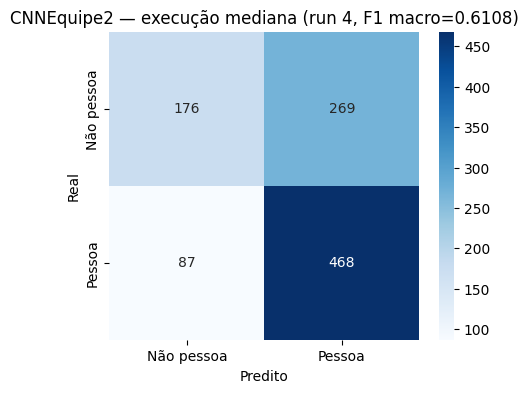

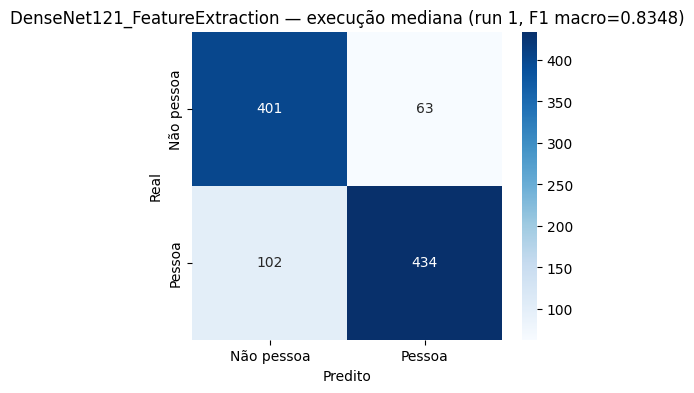

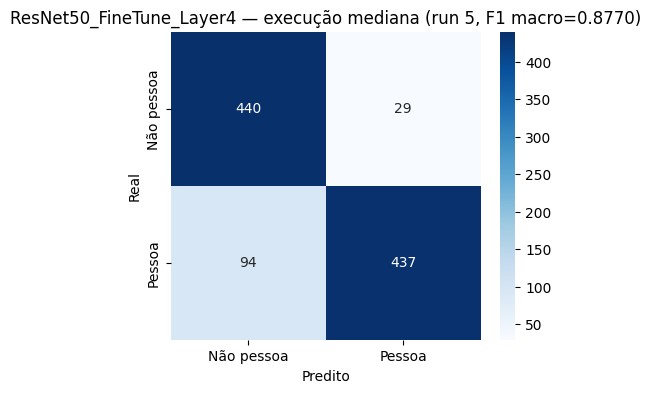

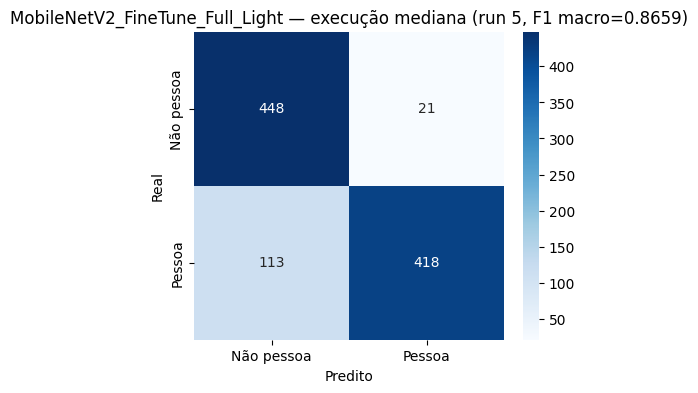

In [ ]:
"""
Matrizes de confusão para os modelos.

Como temos 5 execuções por modelo, plotamos a matriz da execução de
mediana performance em F1 macro para cada modelo. Isso representa um
comportamento típico, evitando escolher manualmente a melhor ou pior execução.

Para cada modelo, mostra:
  - Verdadeiros Negativos (TN, canto superior esquerdo)
  - Falsos Positivos     (FP, canto superior direito)
  - Falsos Negativos     (FN, canto inferior esquerdo)
  - Verdadeiros Positivos (TP, canto inferior direito)
"""

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


def plot_confusion_matrix_from_cm(cm, title):
    """
    Plota uma matriz de confusão já calculada.
    """
    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=["Não pessoa", "Pessoa"],
        yticklabels=["Não pessoa", "Pessoa"]
    )
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.title(title)
    plt.show()


for name in MODEL_NAMES:
    f1_scores = results[name]["f1_macro"]
    median_idx = np.argsort(f1_scores)[len(f1_scores) // 2]
    cm = results[name]["confusion_matrices"][median_idx]

    plot_confusion_matrix_from_cm(
        cm,
        f"{name} — execução mediana (run {median_idx + 1}, F1 macro={f1_scores[median_idx]:.4f})"
    )

## Curvas de Aprendizado

Evolução do loss médio por época durante o treinamento. Modelos com Transfer Learning tendem a convergir mais rápido por aproveitarem features já aprendidas no ImageNet.

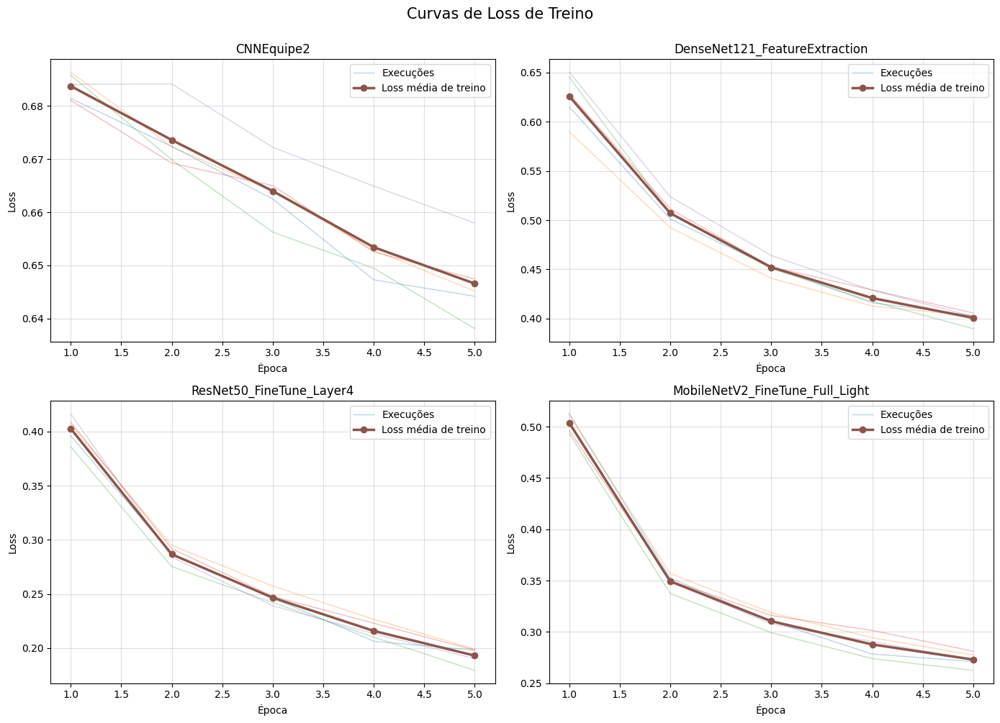

In [ ]:
"""
Curvas de loss de treino por época para todos os experimentos.

Como o treino final armazena a loss média de treino por época, esta célula
plota as curvas das 5 execuções de cada modelo e também a curva média.

O objetivo é documentar se o treinamento reduziu a função de custo ao longo
das épocas, conforme solicitado no enunciado.
"""

import numpy as np
import matplotlib.pyplot as plt

num_models = len(MODEL_NAMES)
num_cols = 2
num_rows = int(np.ceil(num_models / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows))
axes = np.array(axes).reshape(-1)

for i, name in enumerate(MODEL_NAMES):
    ax = axes[i]

    train_runs = np.array(results[name]["train_histories"])
    epochs = np.arange(1, train_runs.shape[1] + 1)

    for run_idx in range(train_runs.shape[0]):
        ax.plot(
            epochs,
            train_runs[run_idx],
            alpha=0.3,
            linewidth=1,
            label="Execuções" if run_idx == 0 else None
        )

    ax.plot(
        epochs,
        train_runs.mean(axis=0),
        linewidth=2.5,
        marker="o",
        label="Loss média de treino"
    )

    ax.set_title(name, fontsize=12)
    ax.set_xlabel("Época")
    ax.set_ylabel("Loss")
    ax.grid(True, alpha=0.4)
    ax.legend(loc="upper right")

for j in range(num_models, len(axes)):
    axes[j].axis("off")

plt.suptitle("Curvas de Loss de Treino", fontsize=15, y=1.00)
plt.tight_layout()
plt.show()

## Resultados Comparativos

Métricas finais no conjunto de teste (1000 imagens do COCO val2017).

In [ ]:
"""
Tabela comparativa das métricas por execução e resumo por modelo.

A tabela detalhada contém uma linha por experimento e execução. As colunas
incluem métricas globais e métricas por classe, conforme solicitado no
enunciado: precisão, sensibilidade/recall e F1-score por classe.
"""

import numpy as np
import pandas as pd

print("=" * 90)
print("TABELA 1 — Resultados por execução")
print("=" * 90)

detailed_rows = []

for name in MODEL_NAMES:
    metadata = MODEL_METADATA[name]

    for run_idx in range(NUM_RUNS):
        detailed_rows.append({
            "Modelo": name,
            "Arquitetura": metadata["architecture"],
            "Estratégia": metadata["strategy"],
            "Execução": run_idx + 1,
            "Accuracy": results[name]["accuracy"][run_idx],
            "Precision macro": results[name]["precision_macro"][run_idx],
            "Recall macro": results[name]["recall_macro"][run_idx],
            "F1 macro": results[name]["f1_macro"][run_idx],
            "Precision não pessoa": results[name]["precision_nao_pessoa"][run_idx],
            "Recall não pessoa": results[name]["recall_nao_pessoa"][run_idx],
            "F1 não pessoa": results[name]["f1_nao_pessoa"][run_idx],
            "Precision pessoa": results[name]["precision_pessoa"][run_idx],
            "Recall pessoa": results[name]["recall_pessoa"][run_idx],
            "F1 pessoa": results[name]["f1_pessoa"][run_idx],
        })

df_detailed = pd.DataFrame(detailed_rows)
display(df_detailed)

print("\n" + "=" * 90)
print("TABELA 2 — Resumo por experimento: média ± desvio padrão")
print("=" * 90)

summary_rows = []

for name in MODEL_NAMES:
    metadata = MODEL_METADATA[name]

    row = {
        "Modelo": name,
        "Arquitetura": metadata["architecture"],
        "Estratégia": metadata["strategy"],
    }

    for metric in METRIC_KEYS:
        values = np.array(results[name][metric])
        row[metric] = f"{values.mean():.4f} ± {values.std():.4f}"

    summary_rows.append(row)

df_summary = pd.DataFrame(summary_rows)
display(df_summary)

csv_detailed_path = "/content/resultados_por_execucao.csv"
csv_summary_path = "/content/resumo_resultados.csv"

df_detailed.to_csv(csv_detailed_path, index=False)
df_summary.to_csv(csv_summary_path, index=False)

print(f"Arquivos salvos:")
print(csv_detailed_path)
print(csv_summary_path)

TABELA 1 — Resultados por execução


,Modelo,Arquitetura,Estratégia,Execução,Accuracy,Precision macro,Recall macro,F1 macro,Precision não pessoa,Recall não pessoa,F1 não pessoa,Precision pessoa,Recall pessoa,F1 pessoa
0,CNNEquipe2,CNN própria,treinada do zero,1,0.643,0.6529,0.6293,0.6221,0.6777,0.4397,0.5333,0.6280,0.8190,0.7109
1,CNNEquipe2,CNN própria,treinada do zero,2,0.607,0.6260,0.5836,0.5580,0.6587,0.2985,0.4108,0.5934,0.8688,0.7052
2,CNNEquipe2,CNN própria,treinada do zero,3,0.645,0.6668,0.6305,0.6177,0.7132,0.4038,0.5157,0.6204,0.8571,0.7198
3,CNNEquipe2,CNN própria,treinada do zero,4,0.644,0.6521,0.6194,0.6108,0.6692,0.3955,0.4972,0.6350,0.8432,0.7245
4,CNNEquipe2,CNN própria,treinada do zero,5,0.623,0.6356,0.6098,0.5977,0.6643,0.3966,0.4967,0.6069,0.8230,0.6986
5,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,1,0.835,0.8352,0.8370,0.8348,0.7972,0.8642,0.8294,0.8732,0.8097,0.8403
6,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,2,0.836,0.8395,0.8407,0.8360,0.7788,0.8976,0.8340,0.9002,0.7837,0.8379
7,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,3,0.826,0.8253,0.8253,0.8253,0.8141,0.8141,0.8141,0.8365,0.8365,0.8365
8,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,4,0.814,0.8124,0.8157,0.8130,0.7692,0.8315,0.7991,0.8555,0.8000,0.8268
9,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,5,0.849,0.8506,0.8515,0.8490,0.8069,0.8913,0.8470,0.8942,0.8117,0.8509



TABELA 2 — Resumo por experimento: média ± desvio padrão


,Modelo,Arquitetura,Estratégia,accuracy,precision_macro,recall_macro,f1_macro,precision_nao_pessoa,recall_nao_pessoa,f1_nao_pessoa,precision_pessoa,recall_pessoa,f1_pessoa
0,CNNEquipe2,CNN própria,treinada do zero,0.6324 ± 0.0151,0.6467 ± 0.0143,0.6145 ± 0.0172,0.6013 ± 0.0232,0.6766 ± 0.0193,0.3868 ± 0.0470,0.4907 ± 0.0422,0.6167 ± 0.0149,0.8422 ± 0.0192,0.7118 ± 0.0094
1,DenseNet121_FeatureExtraction,DenseNet121,feature extraction,0.8320 ± 0.0116,0.8326 ± 0.0130,0.8340 ± 0.0124,0.8316 ± 0.0120,0.7932 ± 0.0169,0.8597 ± 0.0326,0.8247 ± 0.0166,0.8719 ± 0.0238,0.8083 ± 0.0172,0.8385 ± 0.0077
2,ResNet50_FineTune_Layer4,ResNet50,fine-tuning parcial,0.8756 ± 0.0044,0.8775 ± 0.0040,0.8786 ± 0.0037,0.8754 ± 0.0043,0.8293 ± 0.0140,0.9203 ± 0.0217,0.8721 ± 0.0053,0.9258 ± 0.0148,0.8368 ± 0.0231,0.8787 ± 0.0069
3,MobileNetV2_FineTune_Full_Light,MobileNetV2,fine-tuning completo leve,0.8650 ± 0.0053,0.8711 ± 0.0060,0.8705 ± 0.0041,0.8650 ± 0.0054,0.8009 ± 0.0132,0.9414 ± 0.0137,0.8653 ± 0.0072,0.9414 ± 0.0119,0.7997 ± 0.0141,0.8646 ± 0.0044


Arquivos salvos:
/content/resultados_por_execucao.csv
/content/resumo_resultados.csv


In [ ]:
"""
Visualização qualitativa de predições.

Esta seção é complementar às métricas quantitativas. Ela mostra exemplos de
imagens do conjunto de teste com o rótulo real e a predição do modelo.

Verde indica predição correta.
Vermelho indica predição incorreta.
"""

import numpy as np
import matplotlib.pyplot as plt

classes = ["Não pessoa", "Pessoa"]


def denormalize(img):
    """
    Reverte a normalização ImageNet para permitir visualizar a imagem com
    cores próximas das originais.
    """
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = img.cpu().permute(1, 2, 0).numpy()
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img


def show_batch_predictions(images, labels, preds):
    """
    Mostra até oito imagens com rótulo real e predição.
    """
    plt.figure(figsize=(12, 6))

    for i in range(len(images)):
        img = denormalize(images[i])
        real = labels[i].item()
        pred = preds[i].item()

        if real == pred:
            color = "white"
            backgroundcolor = "green"
        else:
            color = "white"
            backgroundcolor = "red"

        title = f"Real: {classes[real]}\nPred: {classes[pred]}"

        plt.subplot(2, 4, i + 1)
        plt.imshow(img)
        plt.title(title, fontsize=12, color=color, backgroundcolor=backgroundcolor)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


def visualize_model_predictions(model, test_loader, name="Modelo", max_pages=2):
    """
    Visualiza predições de um modelo usando batches do test_loader.
    """
    print(f"\nVisualizando predições: {name}")

    model.eval()

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(test_loader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            print(f"Página {batch_idx + 1}")
            show_batch_predictions(images[:8], labels[:8], preds[:8])

            if batch_idx + 1 >= max_pages:
                break


Visualizando predições: CNNEquipe2
Página 1


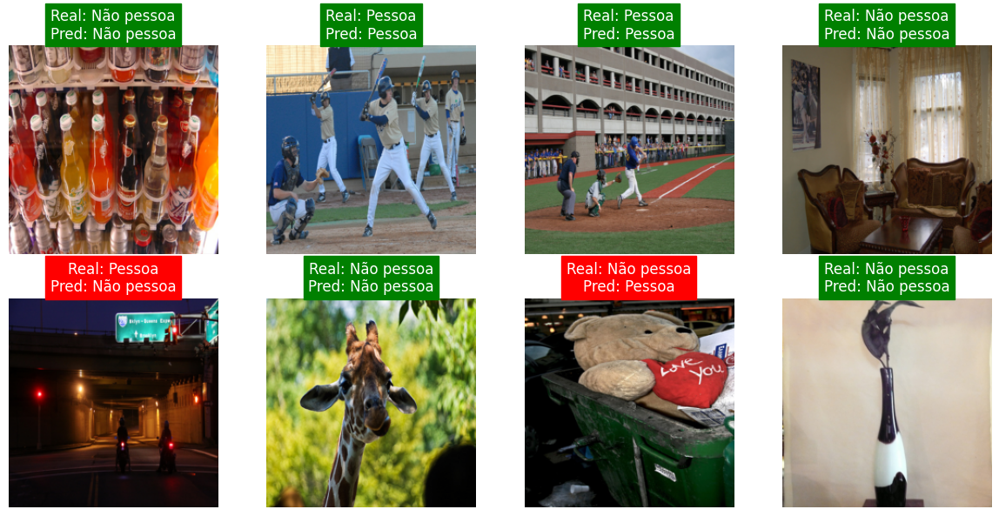

Página 2


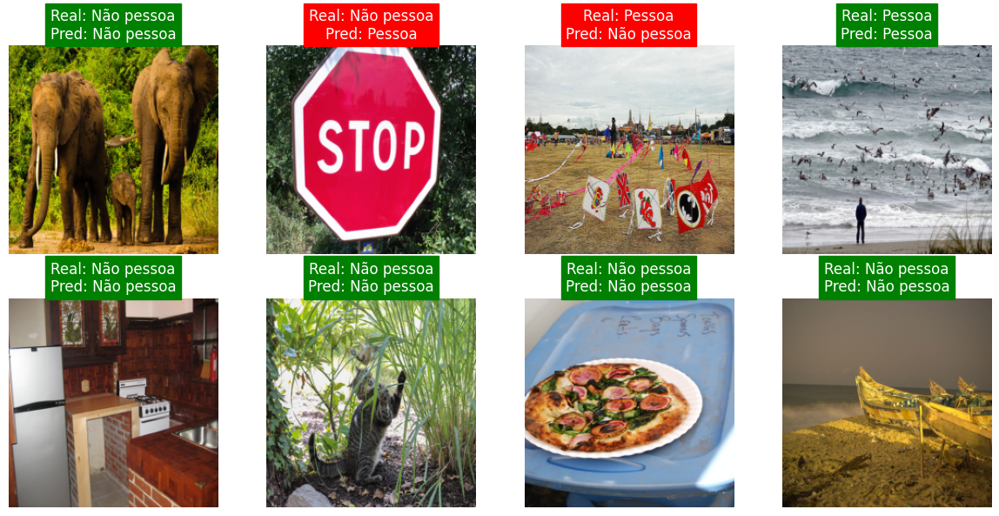


Visualizando predições: DenseNet121
Página 1


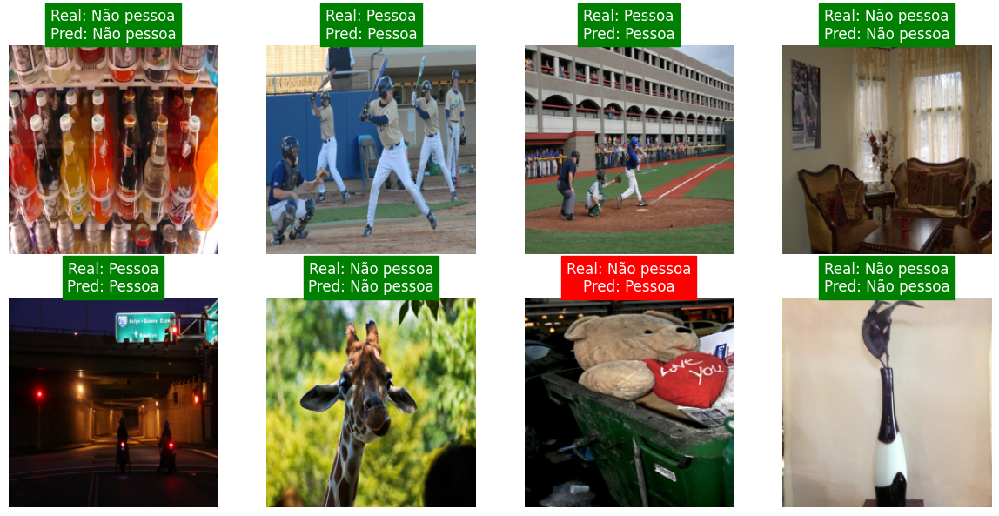

Página 2


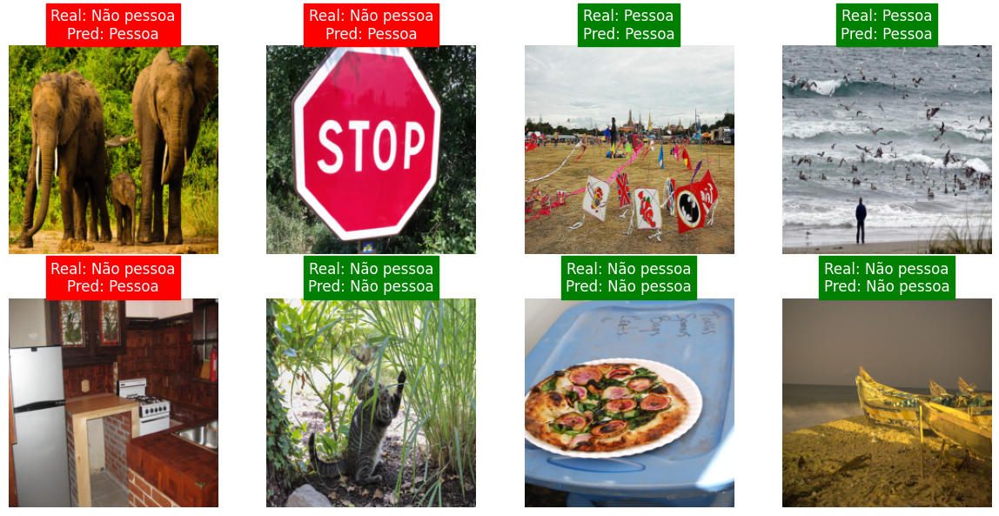


Visualizando predições: ResNet50 Fine-tuning Parcial
Página 1


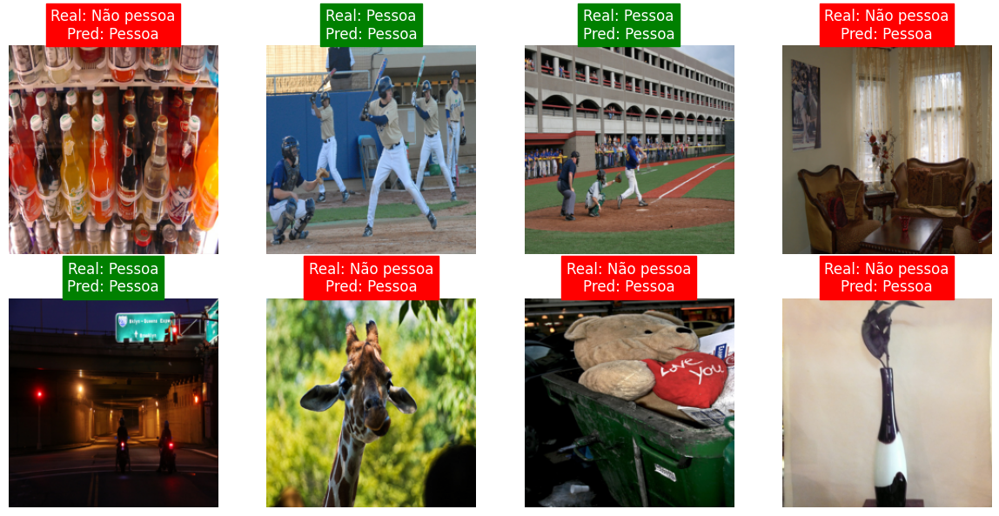

Página 2


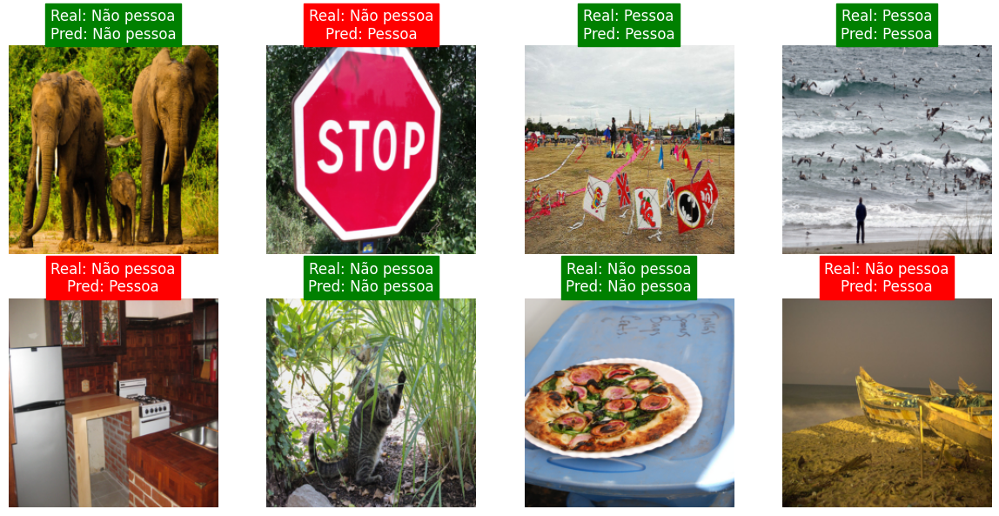


Visualizando predições: MobileNetV2 Fine-tuning Completo Leve
Página 1


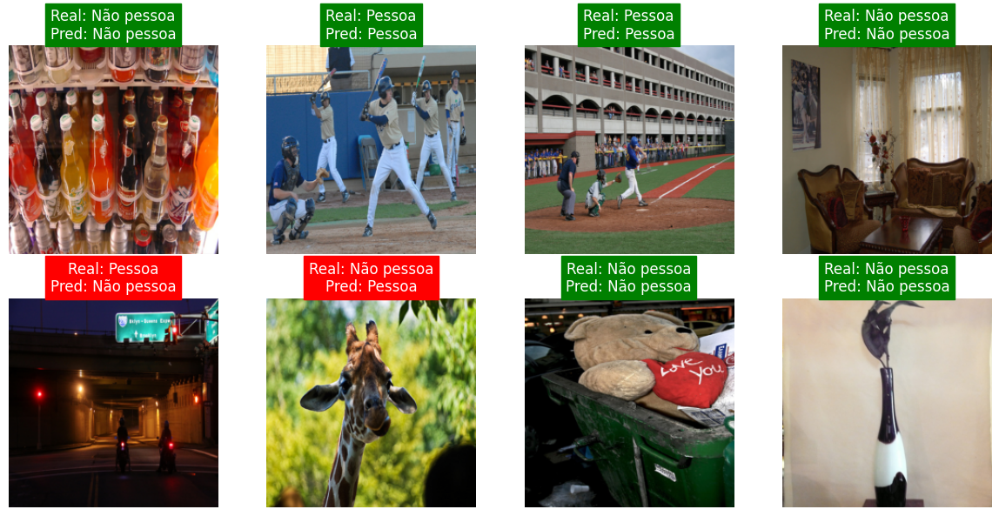

Página 2


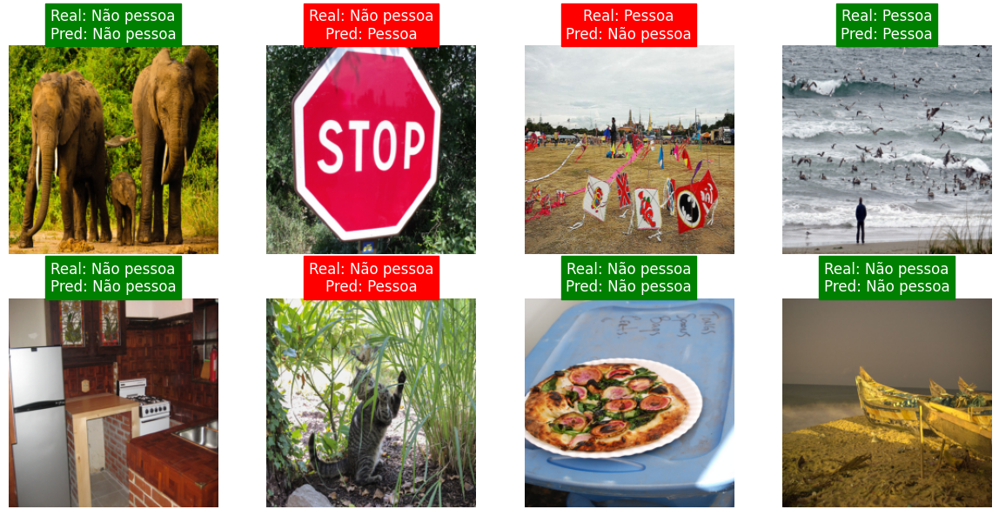

In [ ]:
visualize_model_predictions(
    model=model_cnn,
    test_loader=test_loader,
    name="CNNEquipe2",
    max_pages=2
)

visualize_model_predictions(
    model=model_dense,
    test_loader=test_loader,
    name="DenseNet121",
    max_pages=2
)

visualize_model_predictions(
    model=model_resnet_finetune,
    test_loader=test_loader,
    name="ResNet50 Fine-tuning Parcial",
    max_pages=2
)

visualize_model_predictions(
    model=model_mobilenet,
    test_loader=test_loader,
    name="MobileNetV2 Fine-tuning Completo Leve",
    max_pages=2
)